In [1]:
from models.dcgan import Discriminator, Generator
from models.pix2pix import Pix2PixGenerator, Pix2PixDiscriminator
import os
import math
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np
import torch
from torch import nn,optim
from torchvision import transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.utils as vutils

c:\Users\Logun\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## GPU Availability

In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device('cpu')
device

device(type='cuda', index=0)

## Load data

In [3]:
class TextureHeightmapDataset(Dataset):
  """
  Custom dataset class for loading paired texture and heightmap images with specific naming format.
  """

  def __init__(self, texture_dir, heightmap_dir, rgb_transform=None, grayscale_transform=None):
    """
    Args:
      texture_dir (str): Path to the directory containing texture images.
      heightmap_dir (str): Path to the directory containing heightmap images.
      transform (torchvision.transforms, optional): Transformations to apply to images. Defaults to None.
    """
    self.texture_dir = texture_dir
    self.heightmap_dir = heightmap_dir
    self.rgb_transform = rgb_transform
    self.grayscale_transform = grayscale_transform

    # Get all filenames from the texture directory
    self.image_names = os.listdir(texture_dir)

    # Validate filenames and ensure texture-heightmap pairs exist
    self.image_names = [name for name in self.image_names if self._validate_filename(name)]

  def _validate_filename(self, filename):
    """
    Checks if the filename follows the expected format (texture_xxxx.png)
    and verifies a corresponding heightmap file exists.
    """
    if not filename.startswith("texture_") or not filename.endswith(".png"):
      return False

    # Extract the index from the filename (assuming xxxx format)
    index_str = filename[8:-4]

    # Construct corresponding heightmap filename
    heightmap_filename = f"heightmap_{index_str}.png"
    heightmap_path = os.path.join(self.heightmap_dir, heightmap_filename)

    # Check if the heightmap file exists
    return os.path.exists(heightmap_path)

  def __len__(self):
    return len(self.image_names)

  def __getitem__(self, idx):
    """
    Loads a texture-heightmap pair at the given index.

    Args:
      idx (int): Index of the image pair to load.

    Returns:
      tuple: A tuple containing the preprocessed texture image (tensor) and heightmap image (tensor).
    """
    image_name = self.image_names[idx]

    # Construct texture and heightmap paths
    texture_path = os.path.join(self.texture_dir, image_name)
    heightmap_path = os.path.join(self.heightmap_dir, f"heightmap_{image_name[8:-4]}.png")

    # Load texture and heightmap images
    texture_image = Image.open(texture_path).convert('RGB')
    heightmap_image = Image.open(heightmap_path).convert('L') 


    # Apply transformations if defined
    if self.rgb_transform and self.grayscale_transform:
      texture_image = self.rgb_transform(texture_image)
      heightmap_image = self.grayscale_transform(heightmap_image)

    return texture_image, heightmap_image


In [4]:
batch_size = 64
rgb_transform = transforms.Compose([
    transforms.Resize((64, 64)), 
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize to [-1, 1]
])

grayscale_transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize to desired dimensions
    transforms.ToTensor(),  # Convert image to PyTorch tensor (single channel)
    # Optional normalization (adjust based on your grayscale data distribution)
    # transforms.Normalize((0.5,), (0.5,))  # Normalize single channel (mean, std)
])

# Define your custom dataset
dataset = TextureHeightmapDataset(texture_dir="data\\preprocessed\\texture",
                                 heightmap_dir="data\\preprocessed\\heightmap",
                                 rgb_transform=rgb_transform,grayscale_transform=grayscale_transform)  

# Define the data loader with both textures and heightmaps
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)


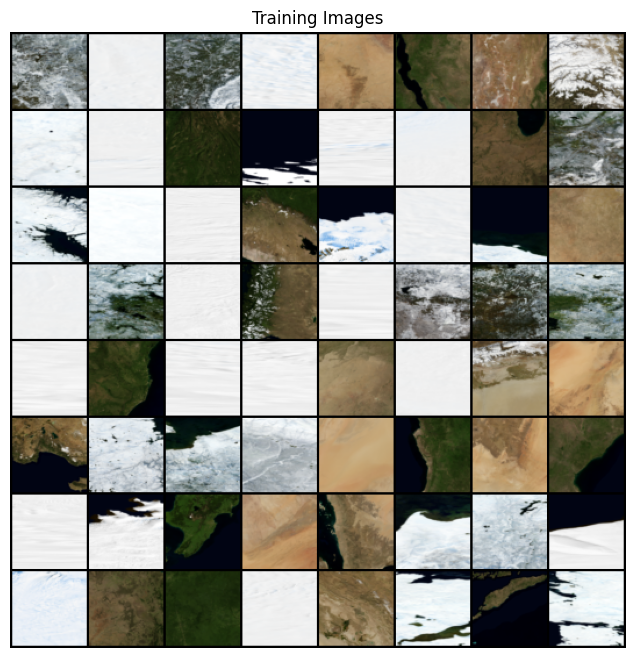

In [5]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

## Training Loop - DCGAN

In [83]:
# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


In [7]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
dcganG = Generator(ngpu,nz,ngf,nc).to(device)
dcganG.apply(weights_init)
print(dcganG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [9]:
dcganD = Discriminator(ngpu,ndf,nc).to(device)

dcganD.apply(weights_init)

print(dcganD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
# # Define loss functions (consider using L1 or MSE for reconstruction)
# criterion_BCE = nn.BCELoss().to(device)
# criterion_L1 = nn.L1Loss().to(device)

# # Establish convention for real and fake labels during training
# real_label = 1.
# fake_label = 0.

# # Setup Adam optimizers for both G and D
# optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
# optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [11]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
# Label smoothing
real_label = 0.9
fake_label = 0.1

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(dcganD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(dcganG.parameters(), lr=lr, betas=(beta1, 0.999))

In [27]:
# # Training loop
# print("Starting Training Loop...")
# for epoch in range(num_epochs):
#     for i, data in enumerate(data_loader, 0):
#         # Get real heightmaps from the data
#         real_heightmaps = data[1].to(device).float()  # Assuming heightmaps are at index 1
#         batch_size = real_heightmaps.size(0)

#         # ---- Train Discriminator: Maximize log(D(real)) + log(1 - D(fake)) ----
#         optimizerD.zero_grad()

#         # Label for real data
#         label = torch.full((batch_size,), 1.0, dtype=torch.float, device=device)
#         # label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)

#         # Generate fake heightmaps
#         noise = torch.randn(batch_size, nz, 1, 1, device=device)

#         fake_heightmaps = netG(noise).detach()  # Detach to avoid gradient propagation to G

#         # Forward pass real data through discriminator
#         output = netD(real_heightmaps).view(-1)
#         errD_real = criterion_BCE(output, label)
#         errD_real.backward()
#         D_x = output.mean().item()

#         # Forward pass fake data through discriminator
#         label.fill_(0.0)  # Label for fake data
#         output = netD(fake_heightmaps).view(-1)
#         errD_fake = criterion_BCE(output, label)
#         errD_fake.backward()
#         D_G_z1 = output.mean().item()

#         # Update Discriminator
#         errD = errD_real + errD_fake
#         optimizerD.step()

#         # ---- Train Generator: Maximize log(D(G(z))) ----
#         optimizerG.zero_grad()

#         # Label for fake data
#         label.fill_(1.0)  # We want the generator to fool the discriminator

#         # Generate fake heightmaps
#         noise = torch.randn(batch_size, nz, 1, 1, device=device)

#         fake_heightmaps = netG(noise)

#         # Forward pass fake data through discriminator
#         output = netD(fake_heightmaps).view(-1)
#         errG = criterion_BCE(output, label)
#         # Consider adding L1 or MSE loss for reconstruction quality
#         errG += criterion_L1(fake_heightmaps, real_heightmaps)  # Optional L1 loss
#         errG.backward()

#         # Update Generator
#         optimizerG.step()

#         # Print training progress
#         if i % 50 == 0:
#             print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f'
#                   % (epoch, num_epochs, i, len(data_loader),
#                      errD.item(), errG.item(), D_x, D_G_z1))

# # Save models
# model_save_dir = "saved_models/dcgan_300epochs"
# os.makedirs(model_save_dir, exist_ok=True)  # Create directory if it doesn't exist

# # Save discriminator (netD)
# torch.save(dcganD.state_dict(), os.path.join(model_save_dir, "dcganD.pth"))

# # Save generator (netG)
# torch.save(dcganG.state_dict(), os.path.join(model_save_dir, "dcganG.pth"))

# print("Models saved successfully!")


In [28]:
# # Save models
# model_save_dir = "saved_models/dcgan_300epochs"
# os.makedirs(model_save_dir, exist_ok=True)  # Create directory if it doesn't exist

# # Save discriminator (netD)
# torch.save(dcganD.state_dict(), os.path.join(model_save_dir, "dcganD.pth"))

# # Save generator (netG)
# torch.save(dcganG.state_dict(), os.path.join(model_save_dir, "dcganG.pth"))

# print("Models saved successfully!")

In [29]:
# Starting Training Loop...
# [0/5][0/10] Loss_D: 0.0001 Loss_G: 68.0393 D(x): 0.9999 D(G(z)): 0.0000
# [1/5][0/10] Loss_D: 0.0000 Loss_G: 67.9437 D(x): 1.0000 D(G(z)): 0.0000
# [2/5][0/10] Loss_D: 0.0000 Loss_G: 68.0624 D(x): 1.0000 D(G(z)): 0.0000
# [3/5][0/10] Loss_D: 0.0000 Loss_G: 67.5860 D(x): 1.0000 D(G(z)): 0.0000
# [4/5][0/10] Loss_D: 0.0000 Loss_G: 67.7605 D(x): 1.0000 D(G(z)): 0.0000
# Models saved successfully!

Starting Training Loop...
[0/100][0/20]	Loss_D: 1.0895	Loss_G: 1.5254	D(x): 0.6801	D(G(z)): 0.4199 / 0.2500
[0/100][10/20]	Loss_D: 1.1190	Loss_G: 1.1028	D(x): 0.5412	D(G(z)): 0.3290 / 0.3105
[1/100][0/20]	Loss_D: 1.6174	Loss_G: 1.1172	D(x): 0.2774	D(G(z)): 0.0544 / 0.3091
[1/100][10/20]	Loss_D: 0.8867	Loss_G: 1.2594	D(x): 0.6145	D(G(z)): 0.1564 / 0.2629
[2/100][0/20]	Loss_D: 1.1135	Loss_G: 1.1186	D(x): 0.4818	D(G(z)): 0.0996 / 0.3290
[2/100][10/20]	Loss_D: 0.8661	Loss_G: 1.7824	D(x): 0.7861	D(G(z)): 0.3415 / 0.1445
[3/100][0/20]	Loss_D: 0.9785	Loss_G: 1.5977	D(x): 0.7700	D(G(z)): 0.4012 / 0.1827
[3/100][10/20]	Loss_D: 1.2530	Loss_G: 1.7602	D(x): 0.5701	D(G(z)): 0.2649 / 0.2097
[4/100][0/20]	Loss_D: 1.7820	Loss_G: 4.1895	D(x): 0.8513	D(G(z)): 0.5641 / 0.0242
[4/100][10/20]	Loss_D: 1.1440	Loss_G: 2.8563	D(x): 0.7701	D(G(z)): 0.5135 / 0.0470
[5/100][0/20]	Loss_D: 1.0333	Loss_G: 0.9882	D(x): 0.5312	D(G(z)): 0.2004 / 0.3725
[5/100][10/20]	Loss_D: 1.0152	Loss_G: 1.1862	D(x): 0.5786	D(G(z)): 

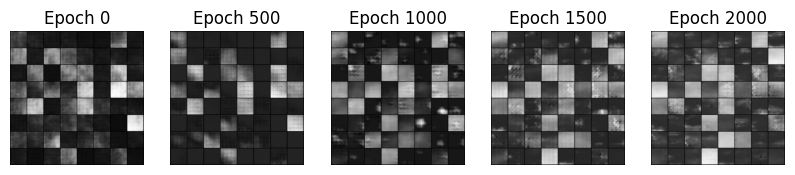

In [31]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        dcganD.zero_grad()
        # Format batch
        real_heightmaps = data[1].to(device)  # Using only the heightmap images
        b_size = real_heightmaps.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = dcganD(real_heightmaps).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake_heightmaps = dcganG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = dcganD(fake_heightmaps.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        dcganG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = dcganD(fake_heightmaps).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # # Check generator loss threshold and stop training if met
        # if errG.item() < 1:
        #     print("Generator loss below threshold. Stopping training.")
        #     break  # Exit training loop

        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = dcganG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

# Define a function to display images side by side
def show_images(img_list):
    fig = plt.figure(figsize=(10, 5))
    num_images = len(img_list)
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.axis("off")
        plt.title("Epoch {}".format(i * 500))  # Title indicating the epoch
        plt.imshow(img_list[i].permute(1, 2, 0))  # Permute dimensions for displaying RGB images
    plt.show()

# After the training loop completes
show_images(img_list)

## Visualization

### First 50 epoch visualization

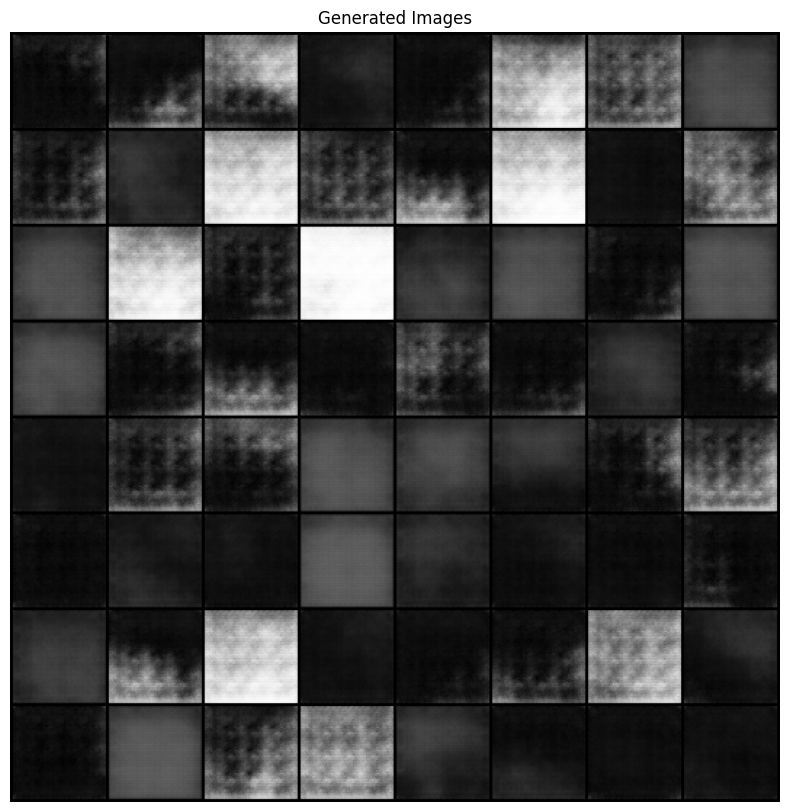

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Generate random noise
num_samples = 64
noise = torch.randn(num_samples, nz, 1, 1, device=device)

# Generate images using the generator
with torch.no_grad():
    fake_images = dcganG(noise).detach().cpu()

# Denormalize the generated images (if normalization was applied during training)
fake_images = (fake_images + 1) / 2  # Assuming images were normalized to range [-1, 1]

# Visualize the generated images
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(
    np.transpose(vutils.make_grid(fake_images, padding=2, normalize=True), (1, 2, 0))
)
plt.show()


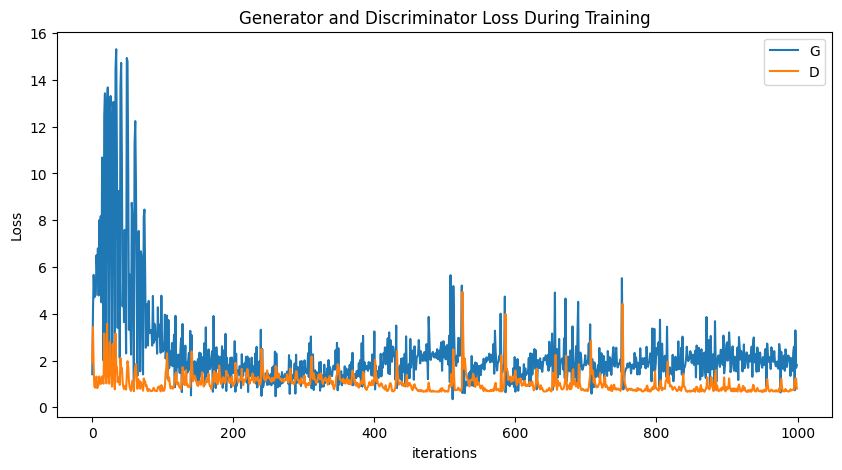

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

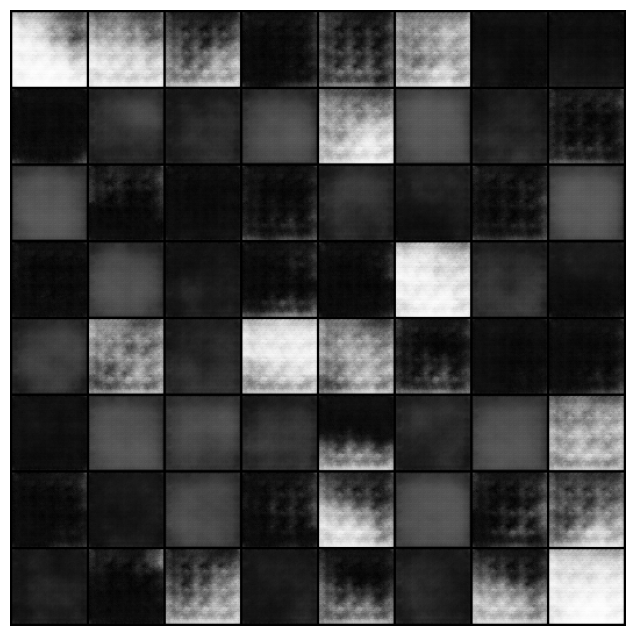

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=3000, repeat_delay=3000, blit=True)

HTML(ani.to_jshtml())

### Final visualization after 300 epochs

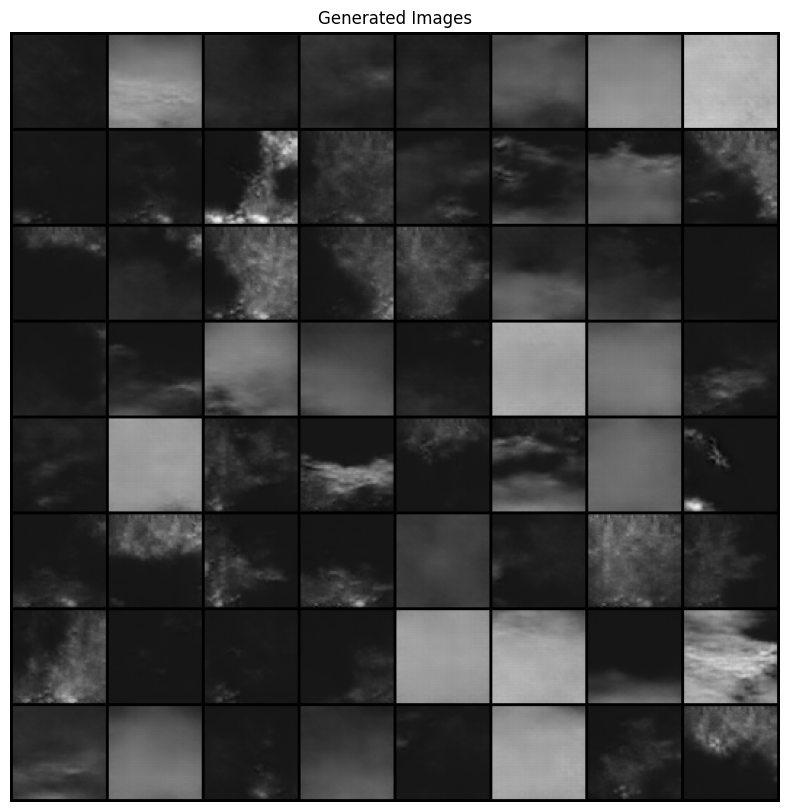

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Generate random noise
num_samples = 64
noise = torch.randn(num_samples, nz, 1, 1, device=device)

# Generate images using the generator
with torch.no_grad():
    fake_images = dcganG(noise).detach().cpu()

# Denormalize the generated images (if normalization was applied during training)
fake_images = (fake_images + 1) / 2  # Assuming images were normalized to range [-1, 1]

# Visualize the generated images
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(
    np.transpose(vutils.make_grid(fake_images, padding=2, normalize=True), (1, 2, 0))
)
plt.show()


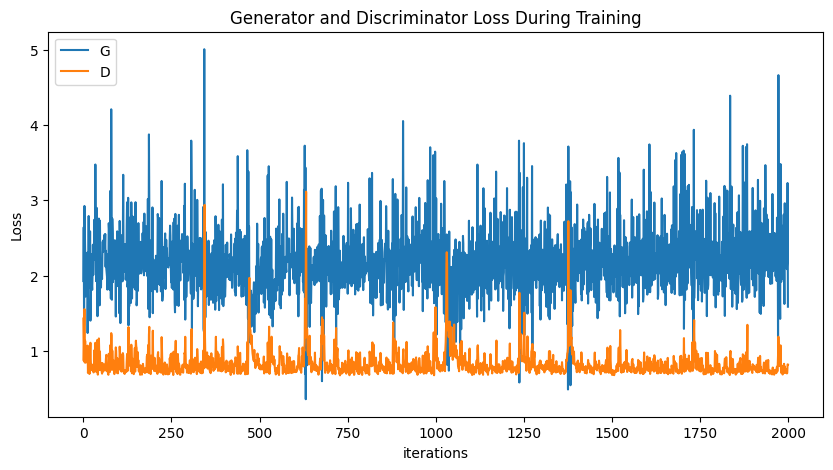

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

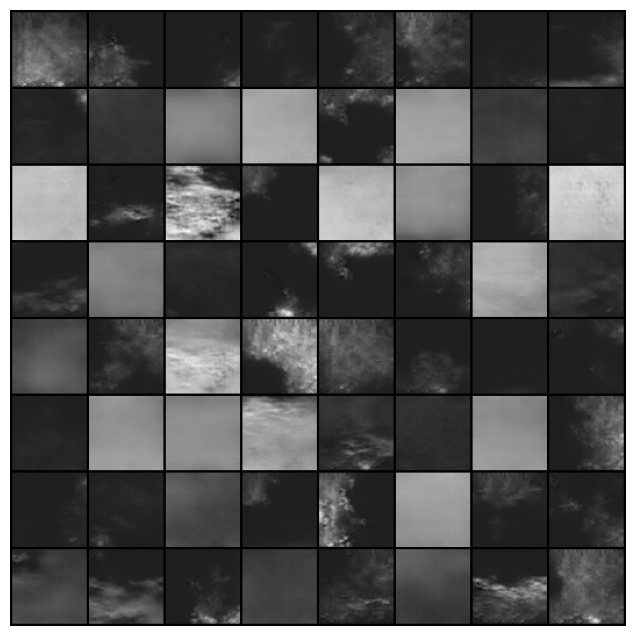

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=3000, repeat_delay=3000, blit=True)

HTML(ani.to_jshtml())

### Use saved model (saved_models/dcgan300epochs/dcganG.pth)

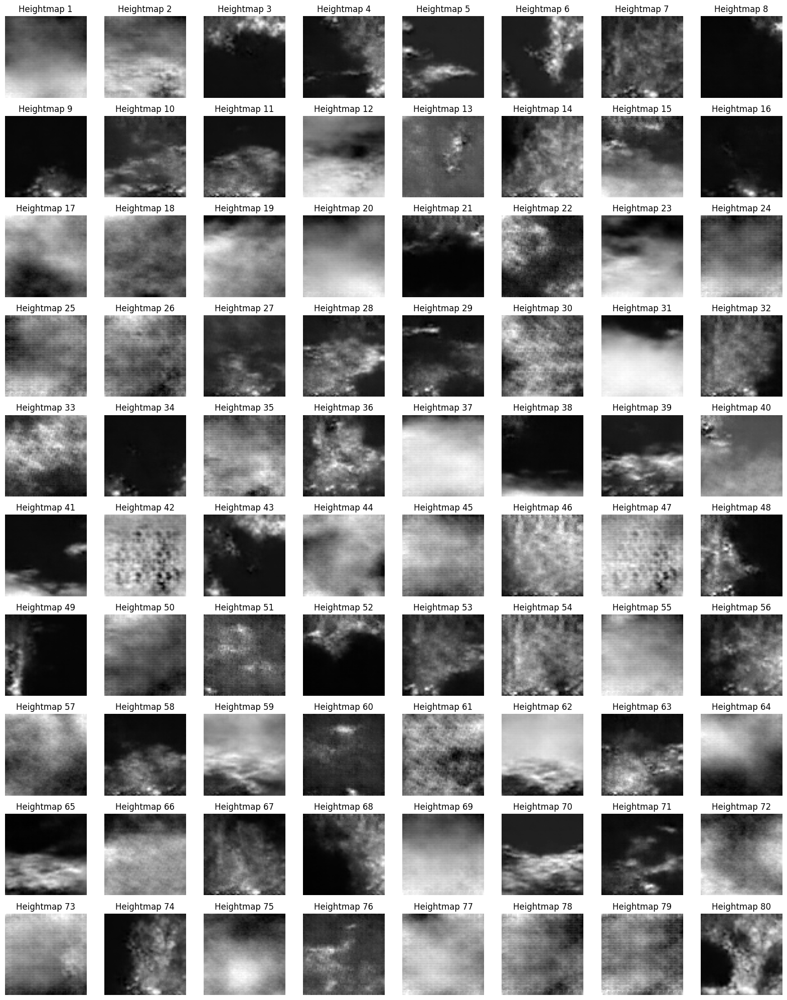

In [84]:
# Load saved models
model_save_dir = "saved_models/dcgan_300epochs"
dcganG = Generator(ngpu, nz, ngf, nc)
dcganG.load_state_dict(torch.load(os.path.join(model_save_dir, "dcganG.pth")))
dcganG.eval()  # Set the model to evaluation mode
generated_heightmaps_list = []

# Generate heightmaps
num_samples = 80
with torch.no_grad():
    # Generate random noise vectors
    noise = torch.randn(num_samples, nz, 1, 1)
    # Generate heightmaps from noise
    generated_heightmaps = dcganG(noise).cpu()

    generated_heightmaps_list.extend(generated_heightmaps)
num_rows = math.ceil(num_samples / 8)

# Show generated heightmaps as plots in rows and columns
plt.figure(figsize=(16, num_rows * 2))  # Adjust figure size based on the number of rows
for i in range(num_samples):
    plt.subplot(num_rows, 8, i+1)  # Adjust subplot position based on the number of rows and columns
    plt.imshow(generated_heightmaps[i].squeeze().numpy(), cmap='gray')
    plt.axis('off')
    plt.title(f'Heightmap {i+1}')

# Adjust layout to avoid overlapping titles
plt.tight_layout(pad=1.0)
plt.show()

## Training loop - pix2pix GAN

### Defining data loader for pix2pix 

In [64]:
batch_size = 1

# Define the min-max normalization function
def min_max_normalize(image):
    min_val = image.min()
    max_val = image.max()
    normalized_image = (image - min_val) / (max_val - min_val)
    return normalized_image

# Define the denormalization function
def denormalize(image, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)):
    for i in range(3):  # Loop over each channel (RGB)
        image[i] = (image[i] * std[i]) + mean[i]
    return image

# Define the new transformation function with min-max normalization
def min_max_rgb_transform(image):
    # Convert the image to PyTorch tensor
    image_tensor = transforms.ToTensor()(image)
    
    # Normalize using min-max normalization
    normalized_image = min_max_normalize(image_tensor)
    
    return normalized_image

rgb_transform = transforms.Compose([
    transforms.Resize((256, 256)), 
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize to [-1, 1]
])

grayscale_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to desired dimensions
    transforms.Grayscale(num_output_channels=3),  # Convert to RGB by replicating the single channel
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])


# Define your custom dataset
dataset = TextureHeightmapDataset(texture_dir="data\\preprocessed\\texture",
                                 heightmap_dir="data\\preprocessed\\heightmap",
                                 rgb_transform=min_max_rgb_transform,grayscale_transform=grayscale_transform)  

# Define the data loader with both textures and heightmaps
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)


### Defining loss functions

In [65]:
loss_comparison = nn.BCEWithLogitsLoss()
L1_loss = nn.L1Loss()

### Creating model instances

In [66]:
pix2pixD = Pix2PixDiscriminator()
pix2pixG = Pix2PixGenerator()

In [67]:
pix2pixG

Pix2PixGenerator(
  (down1): DownSample(
    (model): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
  (down2): DownSample(
    (model): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
  (down3): DownSample(
    (model): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
  (down4): DownSample(
    (model): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
  (down5): DownSample(
    (model): Sequential(
      (0): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
  (down6): DownSample(
    (model): 

In [68]:
pix2pixD

Pix2PixDiscriminator(
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ZeroPad2d((1, 0, 1, 0))
    (7): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
  )
)

### Discriminator training function

In [69]:
def discriminator_training(inputs, targets, discriminator_opt):
    discriminator_opt.zero_grad()

    # passing real image and getting loss

    output =  pix2pixD(inputs, targets)
    label = torch.ones(size = output.shape, dtype=torch.float, device=device)

    real_loss = loss_comparison(output, label)

    # Passing generated image and getting loss

    gen_image = pix2pixG(inputs).detach()

    fake_output = pix2pixD(inputs, gen_image)
    fake_label = torch.zeros(size = fake_output.shape, dtype=torch.float, device=device)

    fake_loss = loss_comparison(fake_output, fake_label)

    Total_loss =  (real_loss + fake_loss)/2

    Total_loss.backward()

    discriminator_opt.step()

    return Total_loss

### Generator training function

In [70]:
def generator_training(inputs, targets, generator_opt, L1_lambda):

    generator_opt.zero_grad()

    generated_image = pix2pixG(inputs)

    disc_output = pix2pixD(inputs, generated_image)
    desired_output = torch.ones(size = disc_output.shape, dtype=torch.float, device=device)

    generator_loss = loss_comparison(disc_output, desired_output) + L1_lambda * torch.abs(generated_image - targets).sum()
    generator_loss.backward()
    generator_opt.step()

    return generator_loss, generated_image

### Training

In [78]:
L1_lambda = 0.01
num_epochs = 10
lr = 0.0002
beta1 = 0.5
beta2 = 0.999

In [72]:
discriminator_opt = optim.Adam(pix2pixD.parameters(), lr=lr, betas=(beta1,beta2))
generator_opt = optim.Adam(pix2pixG.parameters(), lr=lr, betas=(beta1,beta2))

pix2pixG = pix2pixG.to(device)
pix2pixD = pix2pixD.to(device)

In [80]:
# Initialize lists to store losses
disc_losses = []
gen_losses = []

for epoch in range(num_epochs):
    print(f"Training epoch {epoch+1}")
    for i, data in enumerate(dataloader):
        real_textures = data[0].to(device)
        heightmaps = data[1].to(device)

        # Train discriminator
        disc_loss = discriminator_training(heightmaps, real_textures, discriminator_opt)
        disc_losses.append(disc_loss.item())

        # Train generator
        for i in range(2):
            gen_loss, generator_image = generator_training(heightmaps, real_textures, generator_opt, L1_lambda)
            gen_losses.append(gen_loss.item())

   
    print(f"Epoch {epoch}: Discriminator Loss: {np.mean(disc_losses):.4f}, Generator Loss: {np.mean(gen_losses):.4f}")

    # Clear lists after printing
    disc_losses = []
    gen_losses = []


Training epoch 1
Epoch 0: Discriminator Loss: 0.3871, Generator Loss: 386.7151
Training epoch 2
Epoch 1: Discriminator Loss: 0.3727, Generator Loss: 379.5571
Training epoch 3
Epoch 2: Discriminator Loss: 0.3592, Generator Loss: 372.2849
Training epoch 4
Epoch 3: Discriminator Loss: 0.3472, Generator Loss: 363.6115
Training epoch 5
Epoch 4: Discriminator Loss: 0.3399, Generator Loss: 352.5645
Training epoch 6
Epoch 5: Discriminator Loss: 0.3425, Generator Loss: 343.2303
Training epoch 7
Epoch 6: Discriminator Loss: 0.3309, Generator Loss: 334.3311
Training epoch 8
Epoch 7: Discriminator Loss: 0.3099, Generator Loss: 322.6996
Training epoch 9
Epoch 8: Discriminator Loss: 0.2971, Generator Loss: 309.2701
Training epoch 10
Epoch 9: Discriminator Loss: 0.2908, Generator Loss: 295.5106
Training epoch 11
Epoch 10: Discriminator Loss: 0.2709, Generator Loss: 283.4810


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


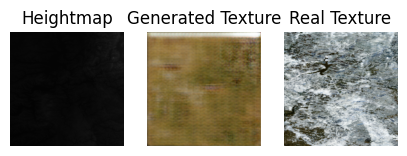

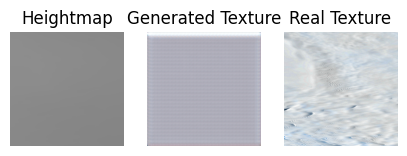

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


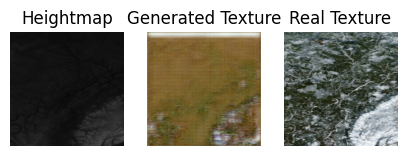

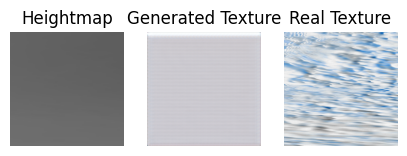

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


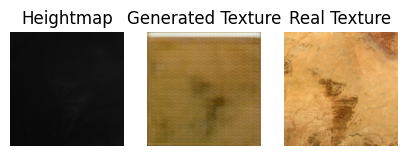

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


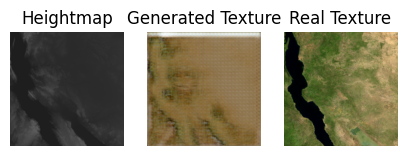

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


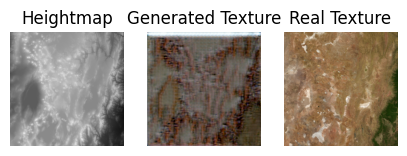

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


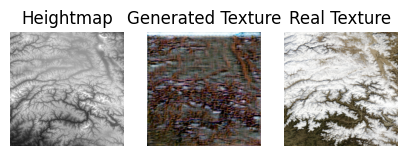

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


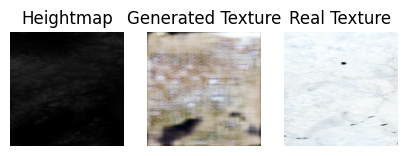

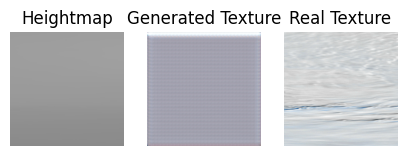

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


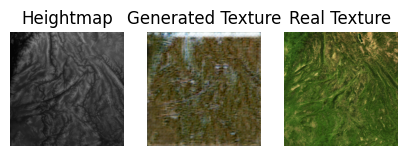

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


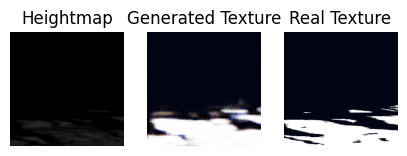

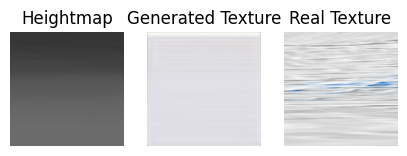

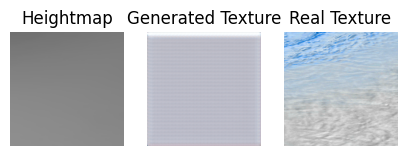

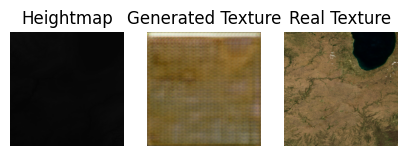

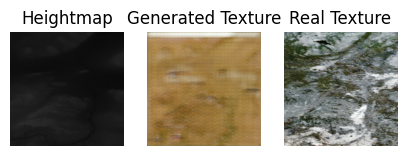

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


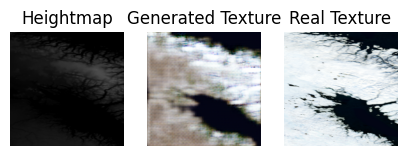

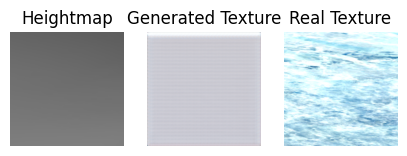

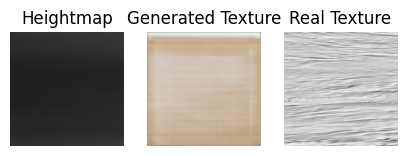

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


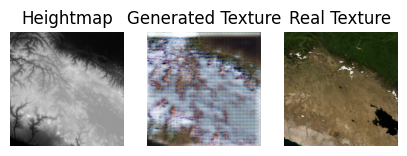

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


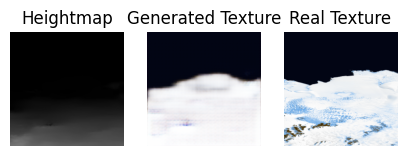

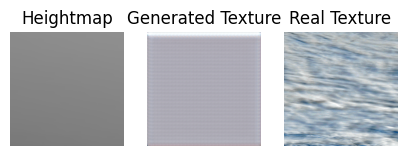

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


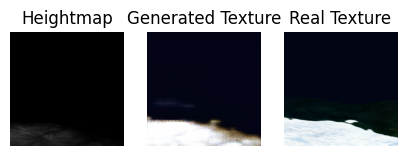

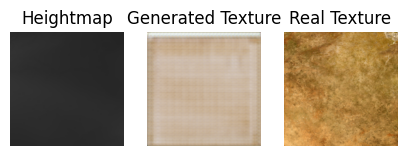

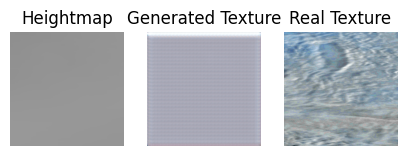

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


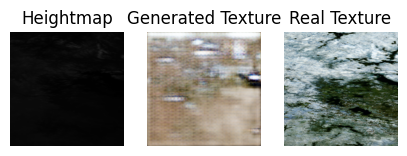

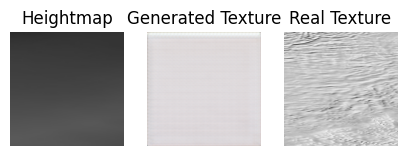

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


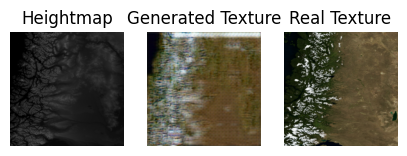

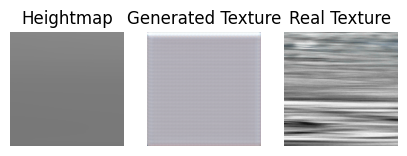

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


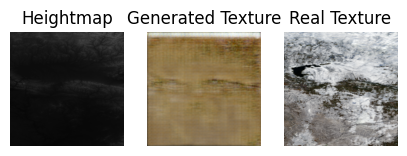

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


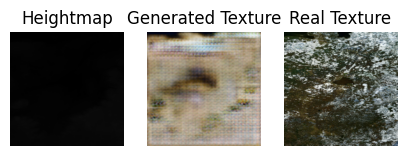

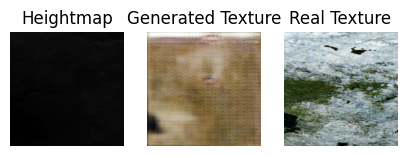

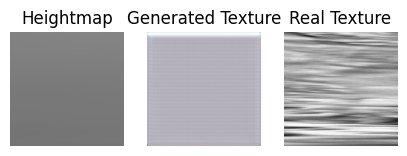

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


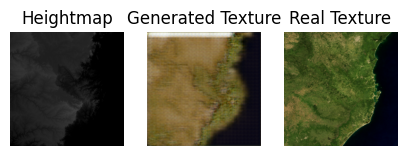

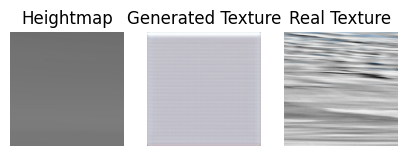

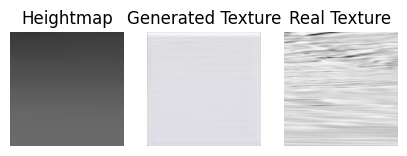

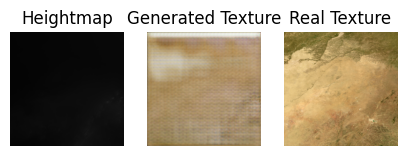

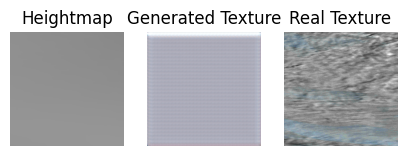

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


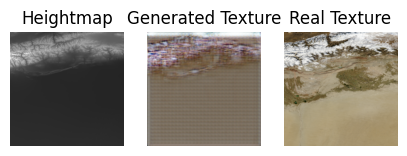

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


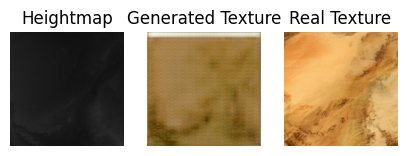

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


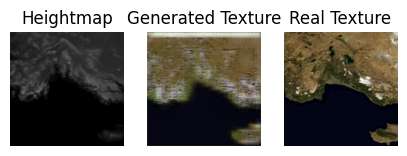

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


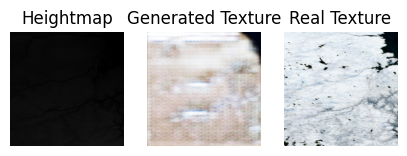

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


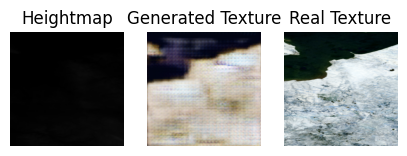

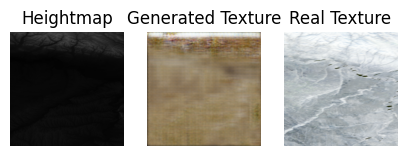

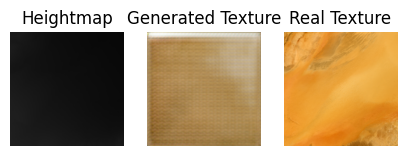

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


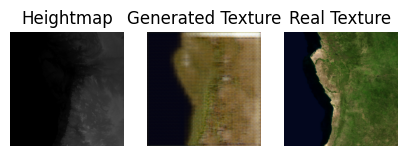

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


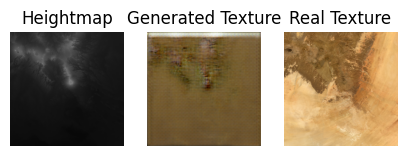

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


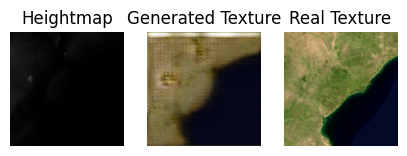

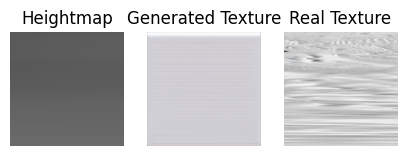

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


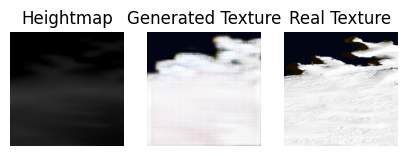

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


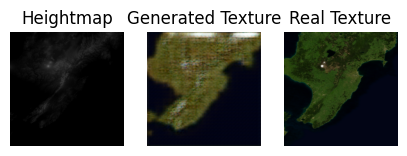

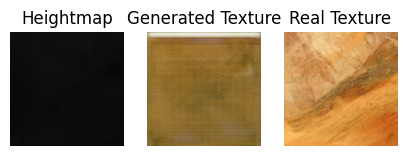

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


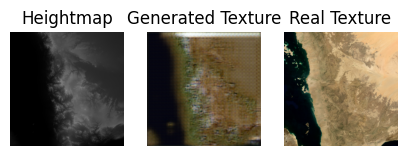

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


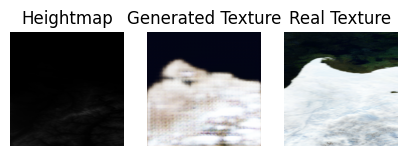

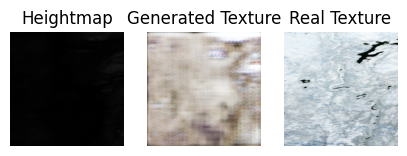

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


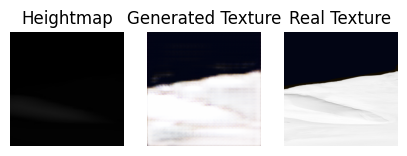

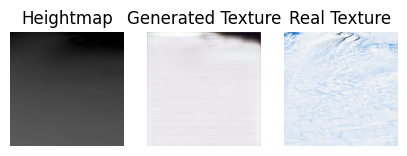

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


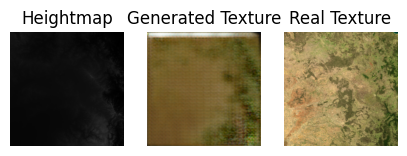

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


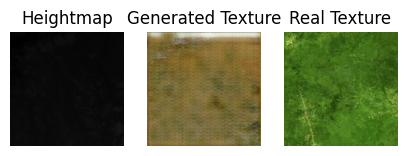

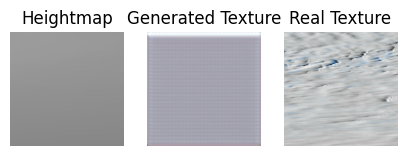

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


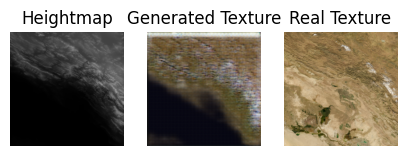

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


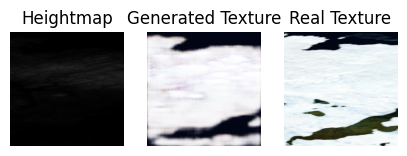

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


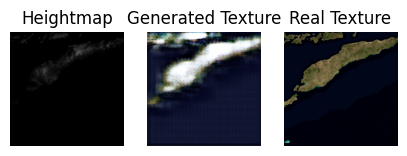

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


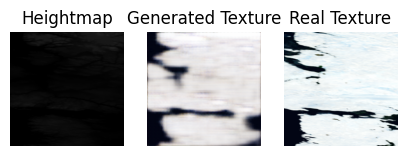

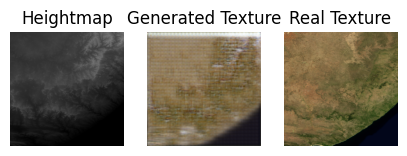

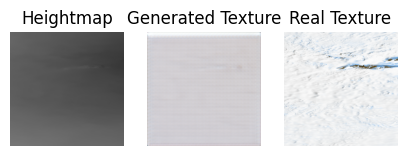

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


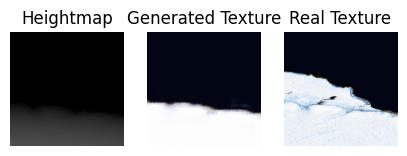

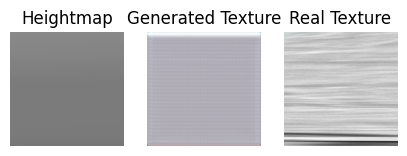

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


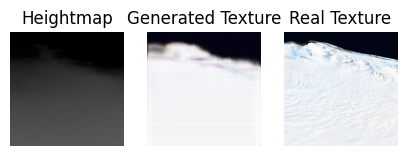

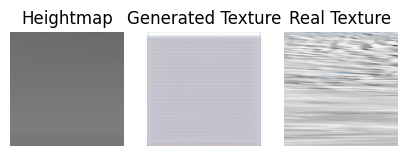

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


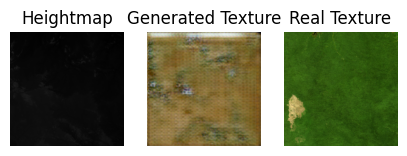

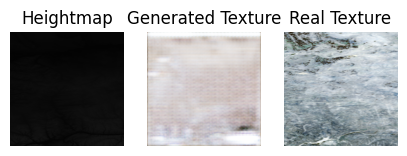

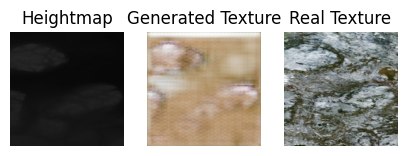

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


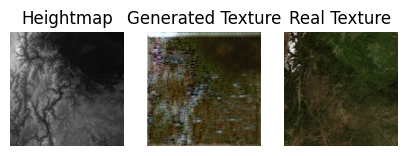

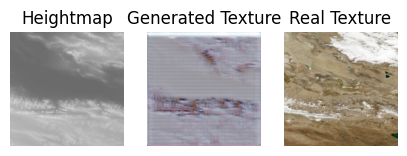

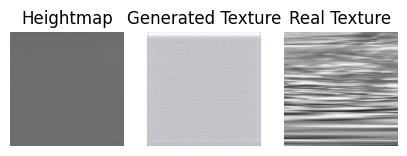

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


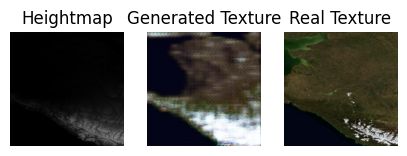

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


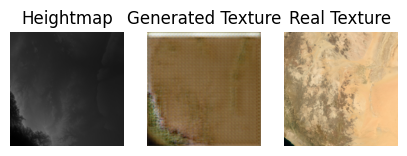

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


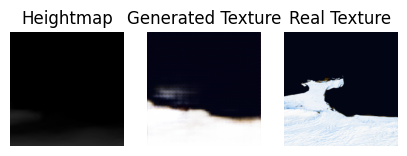

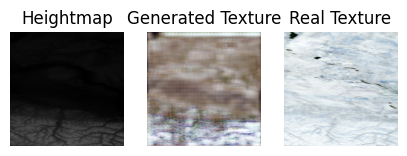

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


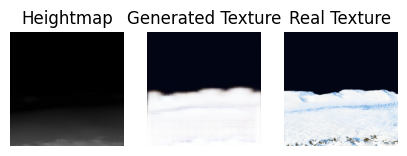

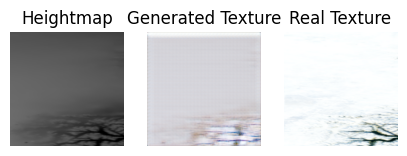

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


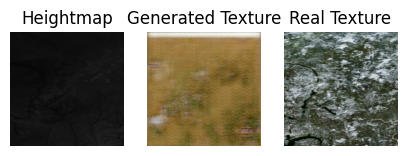

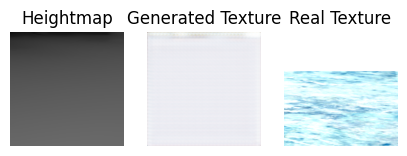

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


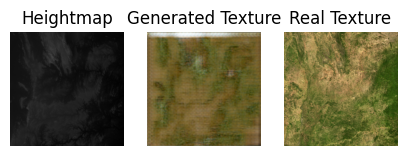

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


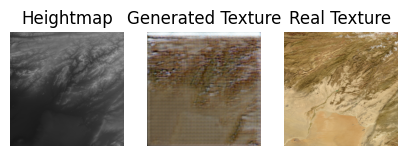

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


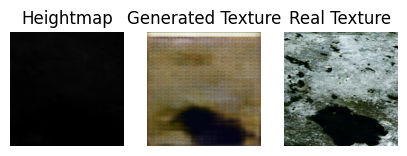

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


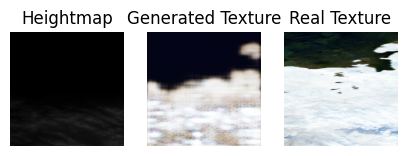

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


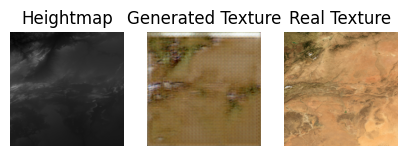

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


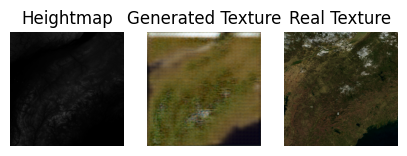

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


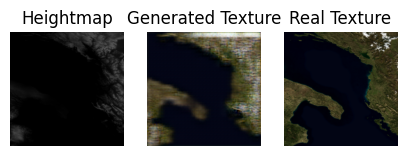

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


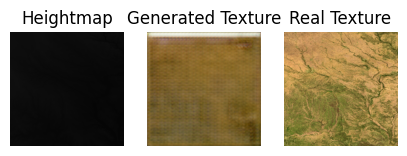

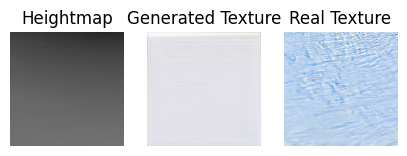

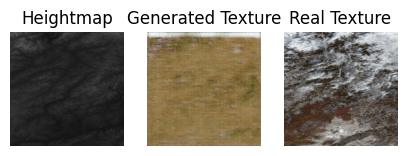

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


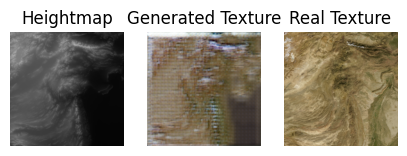

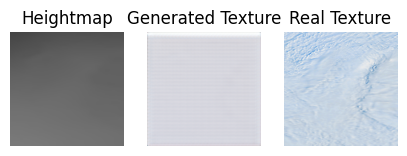

In [105]:
import matplotlib.pyplot as plt

def generate_textures(generator, dataloader, num_images=96):
    generator.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # Turn off gradient tracking
        for i, data in enumerate(dataloader):
            if i >= num_images:
                break
            # if i < 65:
            #     continue
            heightmap = data[1].to(device)  # Heightmap input
            real_texture = data[0].to(device)

            texture_generated = generator(heightmap)

            heightmap = heightmap.cpu()
            texture_generated = texture_generated.cpu()
            real_texture = real_texture.cpu()

            # Convert heightmap and texture_generated to numpy arrays and move to CPU
            heightmap = heightmap.squeeze().cpu().numpy()
            texture_generated = texture_generated.squeeze().cpu().numpy()
            real_texture = real_texture.squeeze().cpu().numpy()

            # Transpose the arrays to have the shape (height, width, channels)
            heightmap = heightmap.transpose(1, 2, 0)
            texture_generated = texture_generated.transpose(1, 2, 0)
            real_texture = real_texture.transpose(1, 2, 0)

            # Display heightmap and generated texture side by side
            plt.figure(figsize=(5, 3))
            plt.subplot(1, 3, 1)
            plt.imshow(heightmap, cmap='gray')  # Display heightmap
            plt.title("Heightmap")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(texture_generated)  # Display generated texture
            plt.title("Generated Texture")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(real_texture)  # Display real texture
            plt.title("Real Texture")
            plt.axis('off')
            plt.show()

# Usage
generate_textures(pix2pixG, dataloader)


In [89]:
# # Save models
# model_save_dir = "saved_models/pix2pix_15epochs"
# os.makedirs(model_save_dir, exist_ok=True)  # Create directory if it doesn't exist

# # Save discriminator 
# torch.save(pix2pixD.state_dict(), os.path.join(model_save_dir, "pix2pixD.pth"))

# # Save generator 
# torch.save(pix2pixG.state_dict(), os.path.join(model_save_dir, "pix2pixG.pth"))

# print("Models saved successfully!")

Models saved successfully!


In [98]:
import torch.nn.functional as F

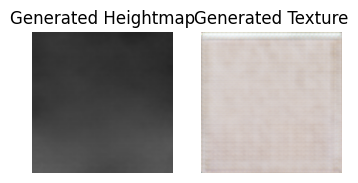

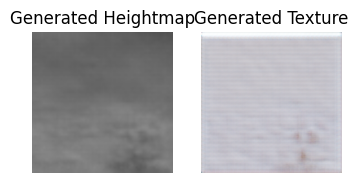

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


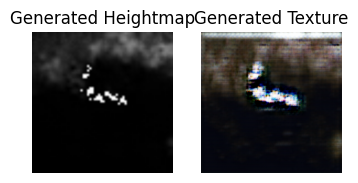

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


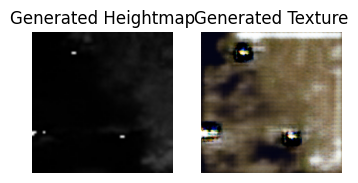

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


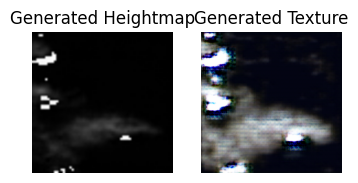

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


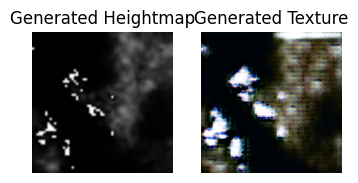

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


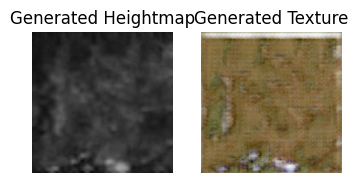

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


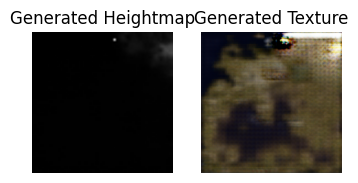

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


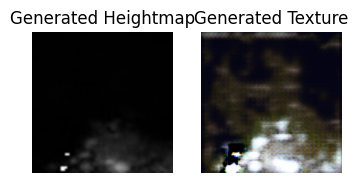

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


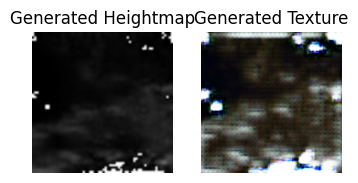

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


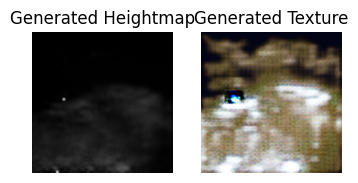

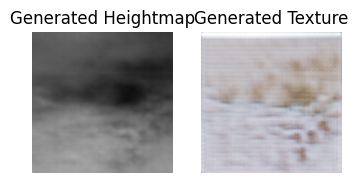

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


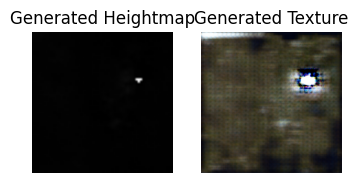

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


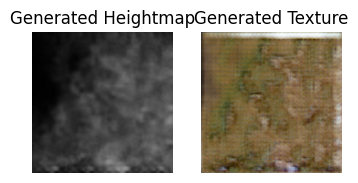

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


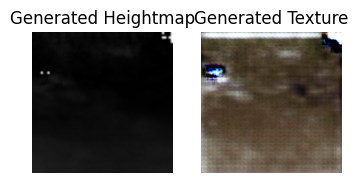

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


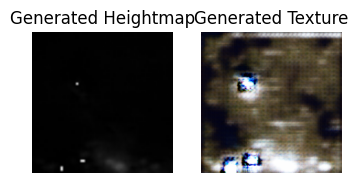

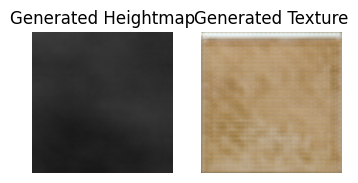

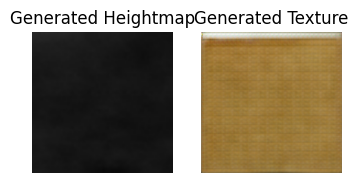

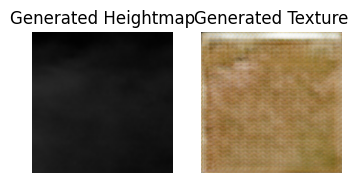

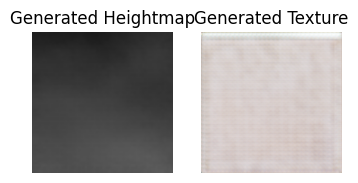

In [128]:
grayscale_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to desired dimensions
    transforms.Grayscale(num_output_channels=3),  # Convert to RGB by replicating the single channel
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

num_images = 20
# for i, data in enumerate(dataloader):
#     print(data[1].shape)
#     break
pix2pixG.eval()  # Set the model to evaluation mode
with torch.no_grad():  # Turn off gradient tracking
    for i in range(num_images):
        if i >= len(generated_heightmaps_list):
            break
        heightmap = generated_heightmaps_list[i].to(device)  # Heightmap input 

        to_pil = transforms.ToPILImage()
        
        heightmap = grayscale_transform(to_pil(heightmap))

        generated_heightmap = heightmap.unsqueeze(0)  # Add a batch dimension
        heightmap = generated_heightmap.expand(1, 3, 256, 256)  # Expand the tensor to match the expected shape

        heightmap.to(device)
        
        # Generate texture from heightmap
        texture_generated = pix2pixG(heightmap)

        # Convert tensor to numpy arrays and move to CPU
        heightmap = heightmap.squeeze().cpu().numpy()
        texture_generated = texture_generated.squeeze().cpu().numpy()

        # Transpose the arrays to have the shape (height, width, channels)
        heightmap = heightmap.transpose(1, 2, 0)
        texture_generated = texture_generated.transpose(1, 2, 0)

        # Display heightmap and generated texture side by sidea
        plt.figure(figsize=(4, 2))
        plt.subplot(1, 2, 1)
        plt.imshow(heightmap, cmap='gray')  # Display heightmap
        plt.title("Generated Heightmap")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(texture_generated)  # Display generated texture
        plt.title("Generated Texture")
        plt.axis('off')

        plt.show()

